### 1 - Import test data

In [25]:

import yfinance as yf
import pandas as pd
import pandas_ta as ta
import numpy as np
from backtesting import Strategy
from backtesting import Backtest
from sklearn.model_selection import ParameterGrid
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime

import multiprocessing as mp
if mp.get_start_method(allow_none=True) != 'fork':
    mp.set_start_method('fork', force=True)
from  matplotlib.colors import LinearSegmentedColormap
cmap=LinearSegmentedColormap.from_list('rg',["r", "w", "g"], N=256) 

In [12]:
def getYFinanceData(ticker, period, interval):
    # Download the data
    dataF = yf.download(ticker, period=period, interval=interval)

    # Convert the DataFrame to ensure it's not a multi-level index
    df = pd.DataFrame(dataF)

    # Reset the index to convert DateTime to a column instead of an index
    df.reset_index(inplace=True)

    # Drop the 'Adj Close' column if it exists
    if 'Adj Close' in df.columns:
        df = df.drop(['Adj Close'], axis=1)

    # Rename 'Datetime' or 'Date' to 'Gmt time'
    if 'Datetime' in df.columns:
        df = df.rename(columns={'Datetime': 'Gmt time'})
    elif 'Date' in df.columns:
        df = df.rename(columns={'Date': 'Gmt time'})

    # Convert 'Gmt time' to datetime format
    df['Gmt time'] = pd.to_datetime(df['Gmt time'])

    # Filter out rows where High equals Low
    df = df[df.High != df.Low]
    
    df.set_index("Gmt time", inplace=True)

    return df

In [13]:
# df = getYFinanceData("^SPX", "720d", "60m")
# df = getYFinanceData("BTC-USD", "720d", "60m")
# df = getYFinanceData("EURJPY=X", "720d", "60m") # amazing
# df = getYFinanceData("USDJPY=X", "720d", "60m")
# df

In [14]:
# Calculate Bollinger Bands and RSI using pandas_ta
# df.ta.bbands(append=True, length=30, std=2)
# df.ta.rsi(append=True, length=14)
# df["atr"] = ta.atr(low = df.Low, close = df.Close, high = df.High, length=14)

# # Rename columns for clarity if necessary
# df.rename(columns={
#     'BBL_30_2.0': 'bbl', 'BBM_30_2.0': 'bbm', 'BBU_30_2.0': 'bbh', 'RSI_14': 'rsi'
# }, inplace=True)

# # Calculate Bollinger Bands Width
# df['bb_width'] = (df['bbh'] - df['bbl']) / df['bbm']
# df

def calculate_technicals(df, atr_length=14, bb_length=30, bb_std=2, rsi_length=14):
    # Calculate Bollinger Bands and RSI using pandas_ta
    df.ta.bbands(append=True, length=bb_length, std=bb_std)
    df.ta.rsi(append=True, length=rsi_length)
    df["atr"] = ta.atr(low = df.Low, close = df.Close, high = df.High, length=atr_length)

    # Rename columns for clarity if necessary
    df.rename(columns={
        'BBL_30_2.0': 'bbl', 'BBM_30_2.0': 'bbm', 'BBU_30_2.0': 'bbh', 'RSI_14': 'rsi'
    }, inplace=True)

    # Calculate Bollinger Bands Width
    df['bb_width'] = (df['bbh'] - df['bbl']) / df['bbm']

    return df

In [15]:
def apply_total_signal(df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015):
    # Initialize the 'TotalSignal' column
    df['TotalSignal'] = 0

    for i in range(1, len(df)):
        # Previous candle conditions for BUY
        prev_candle_closes_below_bb = df['Close'].iloc[i-1] < df['bbl'].iloc[i-1]
        prev_rsi_below_thr = df['rsi'].iloc[i-1] < rsi_threshold_low
        # Current candle conditions for BUY
        closes_above_prev_high = df['Close'].iloc[i] > df['High'].iloc[i-1]
        bb_width_greater_threshold = df['bb_width'].iloc[i] > bb_width_threshold

        # Combine conditions for BUY
        if (prev_candle_closes_below_bb and
            prev_rsi_below_thr and
            closes_above_prev_high and
            bb_width_greater_threshold):
            df.loc[df.index[i], 'TotalSignal'] = 2  # Set the buy signal for the current candle

        # Previous candle conditions for SELL
        prev_candle_closes_above_bb = df['Close'].iloc[i-1] > df['bbh'].iloc[i-1]
        prev_rsi_above_thr = df['rsi'].iloc[i-1] > rsi_threshold_high
        # Current candle conditions for SELL
        closes_below_prev_low = df['Close'].iloc[i] < df['Low'].iloc[i-1]
        bb_width_greater_threshold = df['bb_width'].iloc[i] > bb_width_threshold

        # Combine conditions for SELL
        if (prev_candle_closes_above_bb and
            prev_rsi_above_thr and
            closes_below_prev_low and
            bb_width_greater_threshold):
            df.loc[df.index[i], 'TotalSignal'] = 1  # Set the sell signal for the current candle

    return df

# Example usage
# df = apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015)
# df.dropna(subset=['Close'], inplace=True)

In [16]:
# df

In [17]:
# len(df[df.TotalSignal != 0])

In [18]:
def pointpos(x):
    if x['TotalSignal']==2:
        return x['Low']-1e-4
    elif x['TotalSignal']==1:
        return x['High']+1e-4
    else:
        return np.nan

# df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)

# def apply_pointpos(x):
#     if x['TotalSignal']==2:
#         return x['Low']-1e-4
#     elif x['TotalSignal']==1:
#         return x['High']+1e-4
#     else:
#         return np.nan

In [19]:
# df

In [20]:
def plot_chart(df):
  st=0
  # dfpl = df[st:st+350]#.set_index("Gmt time")
  dfpl = df
  # Create a plot with 2 rows
  fig = make_subplots(rows=2, cols=1)

  # Add candlestick plot on the first row
  fig.add_trace(go.Candlestick(x=dfpl.index,
                              open=dfpl['Open'],
                              high=dfpl['High'],
                              low=dfpl['Low'],
                              close=dfpl['Close']),
                row=1, col=1)

  # Add Bollinger Bands, EMA lines on the same subplot
  fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['bbl'],
                          line=dict(color='green', width=1),
                          name="BBL"),
                row=1, col=1)
  fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['bbh'],
                          line=dict(color='green', width=1),
                          name="BBU"),
                row=1, col=1)

  # Add markers for trade entry points on the same subplot
  fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['pointpos'], mode="markers",
                          marker=dict(size=8, color="MediumPurple"),
                          name="entry"),
                row=1, col=1)

  # Add markers for trade entry points on the same subplot
  fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['rsi'], 
                          line=dict(color='green', width=2),
                          name="BBU"),
                row=2, col=1)

  fig.update_layout(width=1200, height=800, sliders=[])
  fig.show()

### Strategy

#### EURJPYControlTpAndSlSeparately

[*********************100%***********************]  1 of 1 completed

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:525: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:526: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:527: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.i

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/backtesting/backtesting.py:1539: UserWarning:

Searching for best of 361 configurations.




Stats:
Start                     2022-04-13 00:00:00
End                       2025-01-14 19:00:00
Duration                   1007 days 19:00:00
Exposure Time [%]                   34.463708
Equity Final [$]                 439743.78074
Equity Peak [$]                 478452.908637
Return [%]                         339.743781
Buy & Hold Return [%]               19.788182
Return (Ann.) [%]                   67.926756
Volatility (Ann.) [%]               34.233105
Sharpe Ratio                         1.984242
Sortino Ratio                        5.583836
Calmar Ratio                         4.202154
Max. Drawdown [%]                  -16.164747
Avg. Drawdown [%]                   -1.398521
Max. Drawdown Duration      122 days 01:00:00
Avg. Drawdown Duration        2 days 18:00:00
# Trades                                  114
Win Rate [%]                        85.087719
Best Trade [%]                        1.53503
Worst Trade [%]                     -1.446859
Avg. Trade [%]            

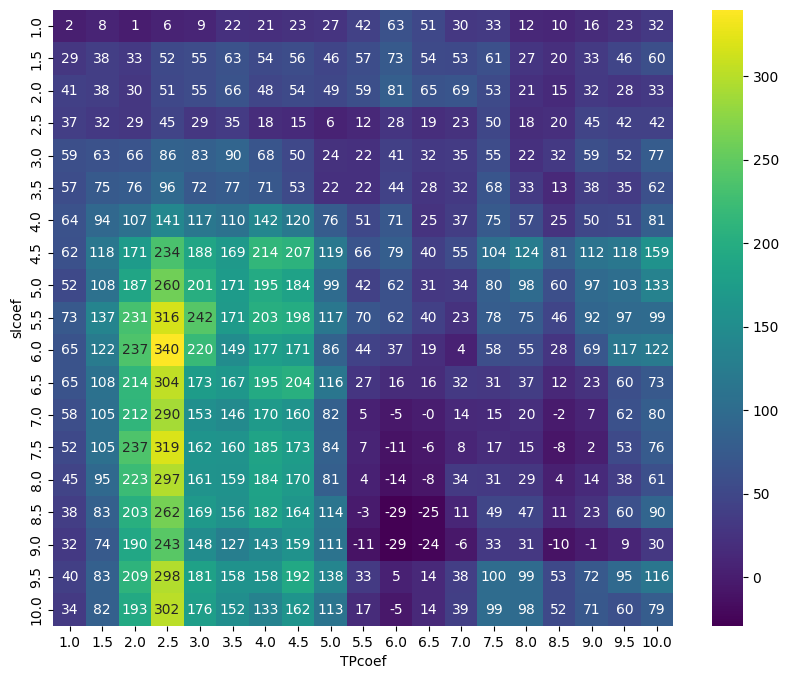

Row(id='63783', ...)

In [78]:
df = getYFinanceData("EURJPY=X", "720d", "60m")
df = calculate_technicals(df)
df = apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015)
df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)
df.dropna(subset=['Close'], inplace=True)
plot_chart(df)

def SIGNAL():
    return df.TotalSignal

class EURJPYControlTpAndSlSeparately(Strategy):
    mysize = 0.02
    slcoef = 3
    TPcoef = 2
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)

    def next(self):
        try:
            super().next()
            slatr = self.slcoef*self.data.atr[-1]
            tpatr = self.TPcoef*self.data.atr[-1]
        
            if self.signal1==2 and len(self.trades)==0:
                sl1 = self.data.Close[-1] - slatr
                tp1 = self.data.Close[-1] + tpatr
                self.buy(sl=sl1, tp=tp1, size=self.mysize)

            if self.signal1==1 and len(self.trades)==0:
                sl1 = self.data.Close[-1] + slatr
                tp1 = self.data.Close[-1] - tpatr
                self.sell(sl=sl1, tp=tp1, size=self.mysize)
        except:
            pass
        
bt = Backtest(df, EURJPYControlTpAndSlSeparately, cash=100000, margin=1/200, commission=0.000) #0.0002
stats, heatmap = bt.optimize(slcoef=[i/10 for i in range(10, 101, 5)],
                    TPcoef=[i/10 for i in range(10, 101, 5)],
                    maximize='Return [%]', max_tries=500,
                        random_state=0,
                        return_heatmap=True)
print("\nStats:")
print(stats)


print("\nStrategy:")
print(stats["_strategy"])

print("\nHeatmap:")
# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap='viridis', fmt='.0f')
plt.show()


bt.plot(filename="*"+str(stats["_strategy"])+".html", resample=False)

#### SPXControlTpAndSlSeparately

In [ ]:
df = getYFinanceData("^SPX", "720d", "60m")
df = calculate_technicals(df)
df = apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015)
df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)
df.dropna(subset=['Close'], inplace=True)
plot_chart(df)

def SIGNAL():
    return df.TotalSignal

class SPXControlTpAndSlSeparately(Strategy):
    mysize = 0.01
    slcoef = 3
    TPcoef = 2
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)

    def next(self):
        try:
            super().next()
            slatr = self.slcoef*self.data.atr[-1]
            tpatr = self.TPcoef*self.data.atr[-1]
        
            if self.signal1==2 and len(self.trades)==0:
                sl1 = self.data.Close[-1] - slatr
                tp1 = self.data.Close[-1] + tpatr
                self.buy(sl=sl1, tp=tp1, size=self.mysize)

            if self.signal1==1 and len(self.trades)==0:
                sl1 = self.data.Close[-1] + slatr
                tp1 = self.data.Close[-1] - tpatr
                self.sell(sl=sl1, tp=tp1, size=self.mysize)
        except:
            pass
        
bt = Backtest(df, SPXControlTpAndSlSeparately, cash=100000, margin=1/200, commission=0.000) #0.0002
stats, heatmap = bt.optimize(slcoef=[i/10 for i in range(10, 101, 5)],
                    TPcoef=[i/10 for i in range(70, 171, 5)],
                    maximize='Sharpe Ratio', max_tries=500,
                        random_state=0,
                        return_heatmap=True)
print("\nStats:")
print(stats)


print("\nStrategy:")
print(stats["_strategy"])

print("\nHeatmap:")
# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap='viridis', fmt='.0f')
plt.show()


bt.plot(filename="*"+str(stats["_strategy"])+".html", resample=False)

#### CLFControlTpAndSlSeparately


[*********************100%***********************]  1 of 1 completed

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:525: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:526: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:527: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.i

                          Open       High        Low      Close  Volume  \
Gmt time                                                                  
2025-01-14 09:00:00  78.339996  78.410004  77.650002  77.739998   35045   
2025-01-14 10:00:00  77.750000  78.160004  77.470001  77.980003   34578   
2025-01-14 11:00:00  77.980003  78.059998  77.410004  77.769997   36356   
2025-01-14 12:00:00  77.760002  78.129997  77.639999  77.750000   21765   
2025-01-14 13:00:00  77.760002  77.870003  77.510002  77.639999   12526   

                           bbl        bbm        bbh  BBB_30_2.0  BBP_30_2.0  \
Gmt time                                                                       
2025-01-14 09:00:00  77.673819  78.453999  79.234179    1.988885    0.042412   
2025-01-14 10:00:00  77.639496  78.437999  79.236503    2.036013    0.213216   
2025-01-14 11:00:00  77.689798  78.447666  79.205534    1.932162    0.052911   
2025-01-14 12:00:00  77.654733  78.438666  79.222599    1.998844    0.0607


Stats:
Start                     2022-09-01 00:00:00
End                       2025-01-14 13:00:00
Duration                    866 days 13:00:00
Exposure Time [%]                   72.442987
Equity Final [$]                294380.335287
Equity Peak [$]                 319848.600193
Return [%]                         194.380335
Buy & Hold Return [%]              -12.764046
Return (Ann.) [%]                   46.463476
Volatility (Ann.) [%]               36.159049
Sharpe Ratio                         1.284975
Sortino Ratio                        2.994665
Calmar Ratio                         2.380331
Max. Drawdown [%]                  -19.519755
Avg. Drawdown [%]                   -1.731965
Max. Drawdown Duration      147 days 19:00:00
Avg. Drawdown Duration        4 days 02:00:00
# Trades                                   39
Win Rate [%]                        66.666667
Best Trade [%]                       9.758309
Worst Trade [%]                     -9.389816
Avg. Trade [%]            

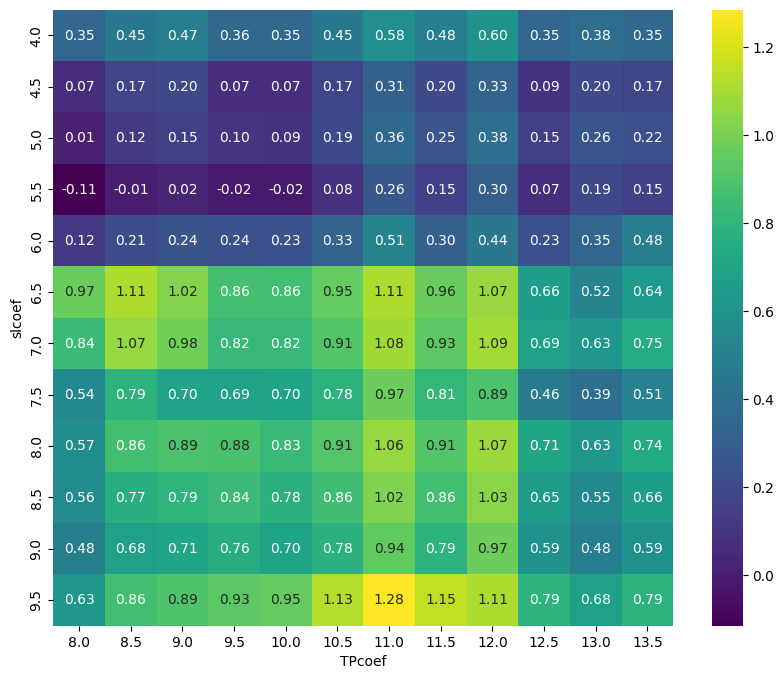

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/backtesting/_plotting.py:456: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/var/folders/mb/tyl8xvh9689bgk14qr31lc7r0000gn/T/ipykernel_24044/1215919318.py:63: UserWarning:

Superimposed OHLC plot matches the original plot. Skipping.



Row(id='60194', ...)

In [75]:
df = getYFinanceData("CL=F", "720d", "60m")
df = calculate_technicals(df, atr_length=28)
df = apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015)
df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)
df.dropna(subset=['Close'], inplace=True)
plot_chart(df)

print(df.tail())

print("TOTAL SIGNAL COUNT: ", len(df[df.TotalSignal != 0]))

def SIGNAL():
    return df.TotalSignal

class CLFControlTpAndSlSeparately(Strategy):
    mysize = 0.01
    slcoef = 3
    TPcoef = 2
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)

    def next(self):
        try:
            super().next()
            slatr = self.slcoef*self.data.atr[-1]
            tpatr = self.TPcoef*self.data.atr[-1]
        
            if self.signal1==2 and len(self.trades)==0:
                sl1 = self.data.Close[-1] - slatr
                tp1 = self.data.Close[-1] + tpatr
                self.buy(sl=sl1, tp=tp1, size=self.mysize)

            if self.signal1==1 and len(self.trades)==0:
                sl1 = self.data.Close[-1] + slatr
                tp1 = self.data.Close[-1] - tpatr
                self.sell(sl=sl1, tp=tp1, size=self.mysize)
        except:
            pass
        
bt = Backtest(df, CLFControlTpAndSlSeparately, cash=100000, margin=1/100, commission=0.000) #0.0002
stats, heatmap = bt.optimize(slcoef=[i/10 for i in range(40, 100, 5)],
                    TPcoef=[i/10 for i in range(80, 140, 5)],
                    maximize='Sharpe Ratio', max_tries=500,
                        random_state=0,
                        return_heatmap=True)
print("\nStats:")
print(stats)


print("\nStrategy:")
print(stats["_strategy"])

print("\nHeatmap:")
# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap='viridis', fmt='.2f')
plt.show()


bt.plot(filename="*"+str(stats["_strategy"])+".html", resample=False)

#### CLFControlTpAndSlSeparately15m

[*********************100%***********************]  1 of 1 completed

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:525: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:526: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:527: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.i


Stats:
Start                     2024-11-03 18:00:00
End                       2025-01-14 14:00:00
Duration                     71 days 20:00:00
Exposure Time [%]                   48.670213
Equity Final [$]                 148393.94259
Equity Peak [$]                 150789.755548
Return [%]                          48.393943
Buy & Hold Return [%]               10.169004
Return (Ann.) [%]                   424.74454
Volatility (Ann.) [%]              129.190842
Sharpe Ratio                         3.287729
Sortino Ratio                       44.266461
Calmar Ratio                        71.830731
Max. Drawdown [%]                   -5.913131
Avg. Drawdown [%]                   -1.078989
Max. Drawdown Duration       18 days 01:30:00
Avg. Drawdown Duration        0 days 14:54:00
# Trades                                   16
Win Rate [%]                            93.75
Best Trade [%]                       3.014893
Worst Trade [%]                     -1.719161
Avg. Trade [%]            

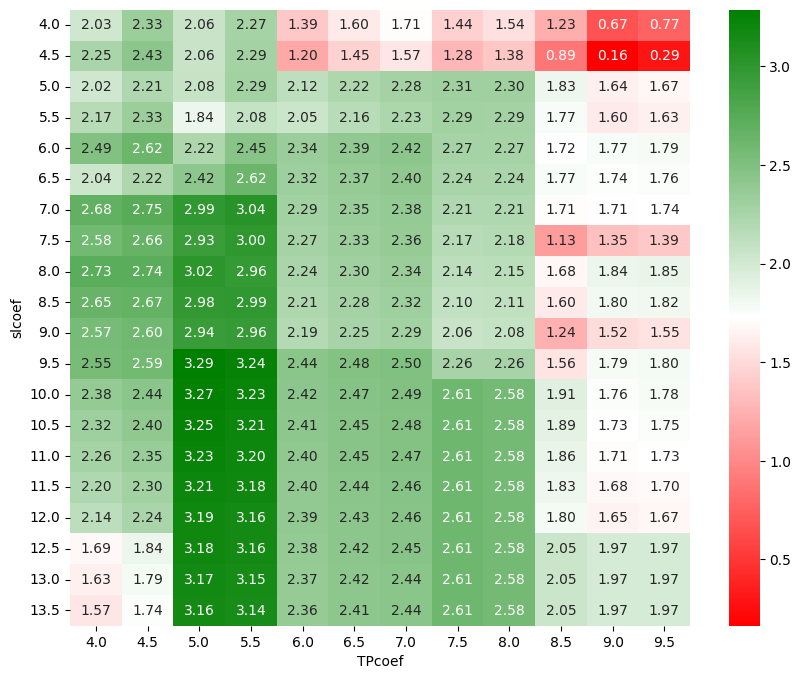

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/backtesting/_plotting.py:456: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



Row(id='62578', ...)

In [77]:
df = getYFinanceData("CL=F", "60d", "15m")
df = calculate_technicals(df, atr_length=14)
df = apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015)
df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)
df.dropna(subset=['Close'], inplace=True)
plot_chart(df)

def SIGNAL():
    return df.TotalSignal

class CLFControlTpAndSlSeparately15m(Strategy):
    mysize = 0.02
    slcoef = 3
    TPcoef = 2
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)

    def next(self):
        try:
            super().next()
            slatr = self.slcoef*self.data.atr[-1]
            tpatr = self.TPcoef*self.data.atr[-1]
        
            if self.signal1==2 and len(self.trades)==0:
                sl1 = self.data.Close[-1] - slatr
                tp1 = self.data.Close[-1] + tpatr
                self.buy(sl=sl1, tp=tp1, size=self.mysize)

            if self.signal1==1 and len(self.trades)==0:
                sl1 = self.data.Close[-1] + slatr
                tp1 = self.data.Close[-1] - tpatr
                self.sell(sl=sl1, tp=tp1, size=self.mysize)
        except:
            pass
        
bt = Backtest(df, CLFControlTpAndSlSeparately15m, cash=100000, margin=1/100, commission=0.000) #0.0002
stats, heatmap = bt.optimize(slcoef=[i/10 for i in range(40, 140, 5)],
                    TPcoef=[i/10 for i in range(40, 100, 5)],
                    maximize='Sharpe Ratio', max_tries=500,
                        random_state=0,
                        return_heatmap=True)
print("\nStats:")
print(stats)


print("\nStrategy:")
print(stats["_strategy"])

print("\nHeatmap:")
# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap=cmap, fmt='.2f')
plt.show()


bt.plot(filename="*"+str(stats["_strategy"])+".html", resample=False)

#### LMT

[*********************100%***********************]  1 of 1 completed

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:525: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:526: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:527: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.i

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/backtesting/backtesting.py:1539: UserWarning:

Searching for best of 361 configurations.




Stats:
Start                     2024-10-23 00:00:00
End                       2025-01-14 16:45:00
Duration                     83 days 16:45:00
Exposure Time [%]                   93.623241
Equity Final [$]                115296.963815
Equity Peak [$]                 121842.486111
Return [%]                          15.296964
Buy & Hold Return [%]               -4.693768
Return (Ann.) [%]                   81.817239
Volatility (Ann.) [%]               46.891654
Sharpe Ratio                         1.744815
Sortino Ratio                         5.33309
Calmar Ratio                         7.509401
Max. Drawdown [%]                  -10.895309
Avg. Drawdown [%]                   -0.747813
Max. Drawdown Duration       43 days 15:00:00
Avg. Drawdown Duration        1 days 00:31:00
# Trades                                    7
Win Rate [%]                        57.142857
Best Trade [%]                       2.560675
Worst Trade [%]                     -1.143845
Avg. Trade [%]            

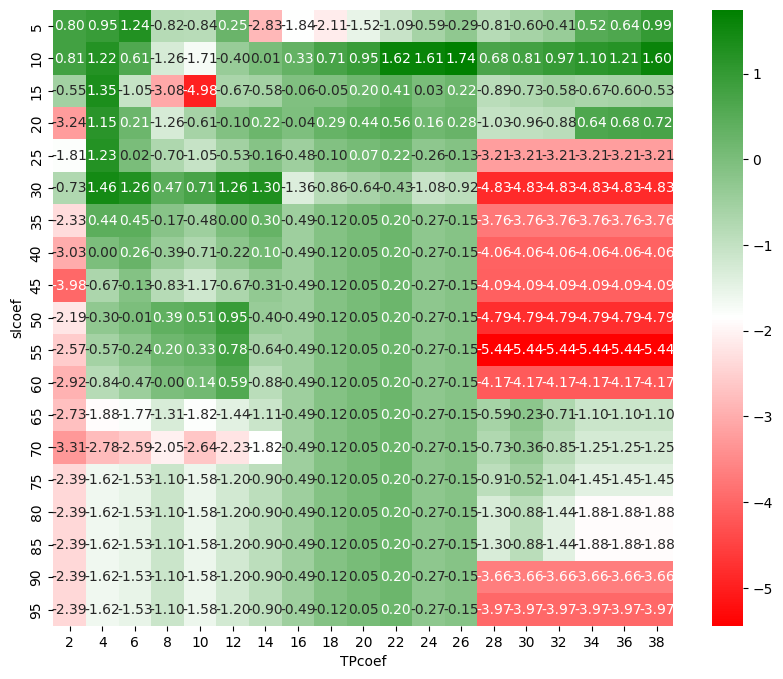

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/backtesting/_plotting.py:456: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



Row(id='48338', ...)

In [65]:
df = getYFinanceData("EURUSD=X", "60d", "15m")
df = calculate_technicals(df, atr_length=14)
df = apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015)
df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)
df.dropna(subset=['Close'], inplace=True)
plot_chart(df)

def SIGNAL():
    return df.TotalSignal

class AUDCADControlTpAndSlSeparately15m(Strategy):
    mysize = 0.02
    slcoef = 3
    TPcoef = 2
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)

    def next(self):
        try:
            super().next()
            slatr = self.slcoef*self.data.atr[-1]
            tpatr = self.TPcoef*self.data.atr[-1]
        
            if self.signal1==2 and len(self.trades)==0:
                sl1 = self.data.Close[-1] - slatr
                tp1 = self.data.Close[-1] + tpatr
                self.buy(sl=sl1, tp=tp1, size=self.mysize)

            if self.signal1==1 and len(self.trades)==0:
                sl1 = self.data.Close[-1] + slatr
                tp1 = self.data.Close[-1] - tpatr
                self.sell(sl=sl1, tp=tp1, size=self.mysize)
        except:
            pass
        
bt = Backtest(df, AUDCADControlTpAndSlSeparately15m, cash=100000, margin=1/200, commission=0.000) #0.0002
stats, heatmap = bt.optimize(slcoef=[i for i in range(5, 100, 5)],
                    TPcoef=[i for i in range(2, 40, 2)],
                    maximize='Sharpe Ratio', max_tries=500,
                        random_state=0,
                        return_heatmap=True)
print("\nStats:")
print(stats)


print("\nStrategy:")
print(stats["_strategy"])

print("\nHeatmap:")
# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap=cmap, fmt='.2f')
plt.show()


bt.plot(filename="*"+str(stats["_strategy"])+".html", resample=False)

#### TSLAMultipleTrades

In [ ]:
df = getYFinanceData("TSLA", "720d", "60m")
df = calculate_technicals(df, atr_length=28)
df = apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015)
df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)
df.dropna(subset=['Close'], inplace=True)
plot_chart(df)

def SIGNAL():
    return df.TotalSignal

class TSLATPSPSeparate(Strategy):
    mysize = 0.02
    slcoef = 1.0  # Stop loss coefficient (multiplier for ATR)
    TPSLRatio = 1.5  # Take-profit-to-stop-loss ratio
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)
        

    def next(self):
        try:
            super().next()
            slatr = self.slcoef*self.data.atr[-1]
            TPSLRatio = self.TPSLRatio
        
            if self.signal1==2 and len(self.trades) == 0:
                sl1 = self.data.Close[-1] - slatr
                tp1 = self.data.Close[-1] + slatr*TPSLRatio
                self.buy(sl=sl1, tp=tp1, size=self.mysize)

            if self.signal1==1 and len(self.trades) == 0:
                sl1 = self.data.Close[-1] + slatr
                tp1 = self.data.Close[-1] - slatr*TPSLRatio
                self.sell(sl=sl1, tp=tp1, size=self.mysize)
        except:
            pass
        
bt = Backtest(df, TSLATPSPSeparate, cash=100000, margin=1/20, commission=0.000) #0.0002
stats, heatmap = bt.optimize(slcoef=[i/1 for i in range(10, 20, 2)],
                    TPSLRatio=[i/10 for i in range(2, 31, 2)],
                    maximize='Return [%]', max_tries=500,
                        random_state=0,
                        return_heatmap=True)

print("\nStats:")
print(stats)


print("\nStrategy:")
print(stats["_strategy"])

print("\Heatmap:")
# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap='viridis', fmt='.0f')
plt.show()


bt.plot(filename=str(stats["_strategy"])+".html", resample=False)

#### EURJPYControlTPSLRatio

In [ ]:
strategyName = "EURJPY=X_ControlTPSLRatio"

# df = getYFinanceData("EURJPY=X", "720d", "60m") # amazing
df = getYFinanceData("EURJPY=X", "720d", "60m")
df = calculate_technicals(df)
df = apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015)
df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)
df.dropna(subset=['Close'], inplace=True)
plot_chart(df)

def SIGNAL():
    return df.TotalSignal

class EURJPYControlTPSLRatio(Strategy):
    mysize = 0.02
    slcoef = 1.0  # Stop loss coefficient (multiplier for ATR)
    TPSLRatio = 1.5  # Take-profit-to-stop-loss ratio
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)
        

    def next(self):
        try:
            super().next()
            slatr = self.slcoef*self.data.atr[-1]
            TPSLRatio = self.TPSLRatio
        
            if self.signal1==2 and len(self.trades)==0:
                sl1 = self.data.Close[-1] - slatr
                tp1 = self.data.Close[-1] + slatr*TPSLRatio
                self.buy(sl=sl1, tp=tp1, size=self.mysize)

            if self.signal1==1 and len(self.trades)==0:
                sl1 = self.data.Close[-1] + slatr
                tp1 = self.data.Close[-1] - slatr*TPSLRatio
                self.sell(sl=sl1, tp=tp1, size=self.mysize)
        except:
            pass
        
bt = Backtest(df, EURJPYControlTPSLRatio, cash=100000, margin=1/100, commission=0.000) #0.0002
stats, heatmap = bt.optimize(slcoef=[i/10 for i in range(10, 101, 5)],
                    TPSLRatio=[i/10 for i in range(10, 41, 2)],
                    maximize='Return [%]', max_tries=500,
                        random_state=0,
                        return_heatmap=True)

print("\nStats:")
print(stats)


print("\nStrategy:")
print(stats["_strategy"])

print("\nHeatmap:")
# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap='viridis', fmt='.0f')
plt.show()


bt.plot(filename="*"+str(stats["_strategy"])+".html", resample=False)

#### AUDCADControlTPSLRatio

[*********************100%***********************]  1 of 1 completed

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:525: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:526: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/yfinance/utils.py:527: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.i

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/backtesting/backtesting.py:1539: UserWarning:

Searching for best of 361 configurations.




Stats:
Start                     2024-10-23 00:00:00
End                       2025-01-14 17:00:00
Duration                     83 days 17:00:00
Exposure Time [%]                   12.892112
Equity Final [$]                102998.931584
Equity Peak [$]                 103360.779746
Return [%]                           2.998932
Buy & Hold Return [%]                -3.81474
Return (Ann.) [%]                   17.804688
Volatility (Ann.) [%]                5.842036
Sharpe Ratio                         3.047685
Sortino Ratio                        5.946084
Calmar Ratio                        10.763413
Max. Drawdown [%]                   -1.654186
Avg. Drawdown [%]                   -0.339752
Max. Drawdown Duration       16 days 09:45:00
Avg. Drawdown Duration        1 days 17:52:00
# Trades                                   18
Win Rate [%]                        77.777778
Best Trade [%]                       0.260596
Worst Trade [%]                     -0.501881
Avg. Trade [%]            

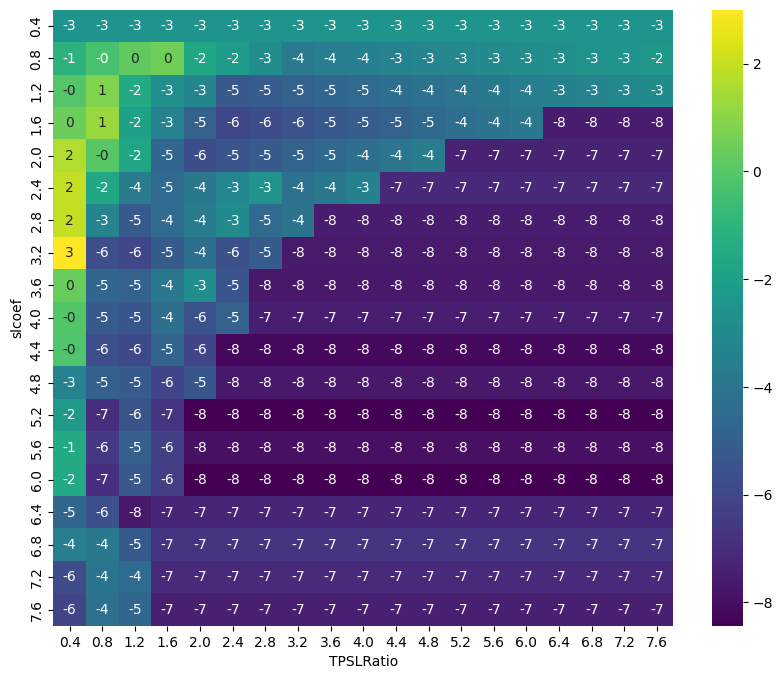

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/backtesting/_plotting.py:456: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



Row(id='54363', ...)

In [70]:
# df = getYFinanceData("EURJPY=X", "720d", "60m") # amazing
df = getYFinanceData("AUDCAD=X", "60d", "15m")
df = calculate_technicals(df)
df = apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015)
df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)
df.dropna(subset=['Close'], inplace=True)
plot_chart(df)

def SIGNAL():
    return df.TotalSignal

class AUDCADControlTPSLRatio(Strategy):
    mysize = 0.02
    slcoef = 1.0  # Stop loss coefficient (multiplier for ATR)
    TPSLRatio = 1.5  # Take-profit-to-stop-loss ratio
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)
        

    def next(self):
        try:
            super().next()
            slatr = self.slcoef*self.data.atr[-1]
            TPSLRatio = self.TPSLRatio
        
            if self.signal1==2 and len(self.trades)==0:
                sl1 = self.data.Close[-1] - slatr
                tp1 = self.data.Close[-1] + slatr*TPSLRatio
                self.buy(sl=sl1, tp=tp1, size=self.mysize)

            if self.signal1==1 and len(self.trades)==0:
                sl1 = self.data.Close[-1] + slatr
                tp1 = self.data.Close[-1] - slatr*TPSLRatio
                self.sell(sl=sl1, tp=tp1, size=self.mysize)
        except:
            pass
        
bt = Backtest(df, AUDCADControlTPSLRatio, cash=100000, margin=1/100, commission=0.000) #0.0002
stats, heatmap = bt.optimize(slcoef=[i/10 for i in range(4, 80, 4)],
                    TPSLRatio=[i/10 for i in range(4, 80, 4)],
                    maximize='Return [%]', max_tries=500,
                        random_state=0,
                        return_heatmap=True)

print("\nStats:")
print(stats)


print("\nStrategy:")
print(stats["_strategy"])

print("\nHeatmap:")
# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap='viridis', fmt='.0f')
plt.show()


bt.plot(filename="*"+str(stats["_strategy"])+".html", resample=False)

### MultipleTrades

#### EURJPYMultipleTrades


In [ ]:
strategyName = "EURJPY=X_MultipleTrades"

df = getYFinanceData("EURJPY=X", "720d", "60m")
df = calculate_technicals(df)
df = apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015)
df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)
df.dropna(subset=['Close'], inplace=True)
plot_chart(df)

def SIGNAL():
    return df.TotalSignal

class EURJPYMultipleTrades(Strategy):
    mysize = 0.02
    slcoef = 1.0  # Stop loss coefficient (multiplier for ATR)
    TPSLRatio = 1.5  # Take-profit-to-stop-loss ratio
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)
        

    def next(self):
        try:
            super().next()
            slatr = self.slcoef*self.data.atr[-1]
            TPSLRatio = self.TPSLRatio
        
            if self.signal1==2 and len(self.trades) < 2:
                sl1 = self.data.Close[-1] - slatr
                tp1 = self.data.Close[-1] + slatr*TPSLRatio
                self.buy(sl=sl1, tp=tp1, size=self.mysize)

            if self.signal1==1 and len(self.trades) < 2:
                sl1 = self.data.Close[-1] + slatr
                tp1 = self.data.Close[-1] - slatr*TPSLRatio
                self.sell(sl=sl1, tp=tp1, size=self.mysize)
        except:
            pass
        
bt = Backtest(df, EURJPYMultipleTrades, cash=100000, margin=1/200, commission=0.000) #0.0002
stats, heatmap = bt.optimize(slcoef=[i/10 for i in range(5, 101, 5)],
                    TPSLRatio=[i/10 for i in range(4, 31, 2)],
                    maximize='Return [%]', max_tries=500,
                        random_state=0,
                        return_heatmap=True)

print("\nStats:")
print(stats)


print("\nStrategy:")
print(stats["_strategy"])

print("\Heatmap:")
# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap='viridis', fmt='.0f')
plt.show()


bt.plot(filename="*"+str(stats["_strategy"])+".html", resample=False)

In [ ]:
strategyName = "USDJPY=X_MultipleTrades"

df = getYFinanceData("USDJPY=X", "720d", "60m")
df = calculate_technicals(df)
df = apply_total_signal(df=df, rsi_threshold_low=30, rsi_threshold_high=70, bb_width_threshold=0.0015)
df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)
df.dropna(subset=['Close'], inplace=True)
plot_chart(df)


class USDJPYMultipleTrades(Strategy):
    mysize = 0.02
    slcoef = 1.0  # Stop loss coefficient (multiplier for ATR)
    TPSLRatio = 1.5  # Take-profit-to-stop-loss ratio
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)
        

    def next(self):
        try:
            super().next()
            slatr = self.slcoef*self.data.atr[-1]
            TPSLRatio = self.TPSLRatio
        
            if self.signal1==2 and len(self.trades) < 2:
                sl1 = self.data.Close[-1] - slatr
                tp1 = self.data.Close[-1] + slatr*TPSLRatio
                self.buy(sl=sl1, tp=tp1, size=self.mysize)

            if self.signal1==1 and len(self.trades) < 2:
                sl1 = self.data.Close[-1] + slatr
                tp1 = self.data.Close[-1] - slatr*TPSLRatio
                self.sell(sl=sl1, tp=tp1, size=self.mysize)
        except:
            pass
        
bt = Backtest(df, USDJPYMultipleTrades, cash=100000, margin=1/200, commission=0.000) #0.0002
stats, heatmap = bt.optimize(slcoef=[i/10 for i in range(5, 51, 5)],
                    TPSLRatio=[i/10 for i in range(4, 31, 2)],
                    maximize='Return [%]', max_tries=500,
                        random_state=0,
                        return_heatmap=True)

print("\nStats:")
print(stats)


print("\nStrategy:")
print(stats["_strategy"])

print("\nHeatmap:")
# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap='viridis', fmt='.0f')
plt.show()


bt.plot(filename=str(stats["_strategy"])+".html", resample=False)